## Exercise 6.3 Geographic visualization

### This script contains the following:

#### 1. Import data and libraries

#### 2. Data wrangling and cleaning

#### 3. Plotting a Choropleth map

#### 4. Results

#### 1. Import data and libraries

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import os
import folium
import json
import geopy
from geopy.geocoders import Nominatim

In [3]:
# This command prompts matplotlib visuals to appear in the notebook 

%matplotlib inline

In [4]:
# creating path folder 
path = r'C:\Users\cpaul\Documents\Career Foundry\Causes of deaths other than diseases'

# Import ".json" file for the World
world_geo = os.path.join(path, 'Data', 'Original Data', 'world-countries.json')

# Imported another geojson file since the the country names were not matching with the primary dataset with the previous JSON file
# But, this geojson file had more mismatches and hence ended up using the previous JSON file
countries_geojson = os.path.join(path, 'Data', 'Original Data', 'countries.geojson')

# Import dataset, causes_of_deaths_merged.csv to create df
df = pd.read_csv(os.path.join(path, 'Data', 'Prepared Data', 'causes_of_deaths_merged_wrangled.csv'), index_col = False)

In [5]:
# Checking the JSON file contents:

f = open(os.path.join(path, 'Data', 'Original Data', 'world-countries.json'))
  
# returns JSON object asa dictionary
data = json.load(f)
  
# Iterating through the json list
for i in data['features']:
    print(i)

{'type': 'Feature', 'properties': {'name': 'Afghanistan'}, 'geometry': {'type': 'Polygon', 'coordinates': [[[61.210817, 35.650072], [62.230651, 35.270664], [62.984662, 35.404041], [63.193538, 35.857166], [63.982896, 36.007957], [64.546479, 36.312073], [64.746105, 37.111818], [65.588948, 37.305217], [65.745631, 37.661164], [66.217385, 37.39379], [66.518607, 37.362784], [67.075782, 37.356144], [67.83, 37.144994], [68.135562, 37.023115], [68.859446, 37.344336], [69.196273, 37.151144], [69.518785, 37.608997], [70.116578, 37.588223], [70.270574, 37.735165], [70.376304, 38.138396], [70.806821, 38.486282], [71.348131, 38.258905], [71.239404, 37.953265], [71.541918, 37.905774], [71.448693, 37.065645], [71.844638, 36.738171], [72.193041, 36.948288], [72.63689, 37.047558], [73.260056, 37.495257], [73.948696, 37.421566], [74.980002, 37.41999], [75.158028, 37.133031], [74.575893, 37.020841], [74.067552, 36.836176], [72.920025, 36.720007], [71.846292, 36.509942], [71.262348, 36.074388], [71.498768,

In [6]:
# Checking the dataset

df.shape

(10670, 15)

In [7]:
df.head(10)

,Unnamed: 0,country,country_code,year,deaths,cause,male_population,female_population,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita
0,0,Afghanistan,AFG,2007,8216,Conflict and Terrorism,13938967.0,13161569.0,27100536.0,9.715765e+09,Low income,Asia,Southern Asia,0.030317,358.508227
1,1,Albania,ALB,2007,0,Conflict and Terrorism,1491760.0,1478257.0,2970017.0,1.067732e+10,Lower Middle income,Europe,Southern Europe,0.000000,3595.038302
2,2,Algeria,DZA,2007,699,Conflict and Terrorism,17263892.0,16903080.0,34166972.0,1.350000e+11,Lower Middle income,Africa,Northern Africa,0.002046,3951.184202
3,3,American Samoa,ASM,2007,2,Conflict and Terrorism,NaN,NaN,NaN,5.180000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
4,4,Angola,AGO,2007,34,Conflict and Terrorism,10354341.0,10551022.0,20905363.0,6.526642e+10,Lower Middle income,Africa,Sub-Saharan Africa,0.000163,3121.993897
5,5,Antigua and Barbuda,ATG,2007,0,Conflict and Terrorism,40016.0,44010.0,84026.0,1.312759e+09,High income,Americas,Latin America and the Caribbean,0.000000,15623.250649
6,6,Argentina,ARG,2007,0,Conflict and Terrorism,19293165.0,20391130.0,39684295.0,2.880000e+11,Upper Middle income,Americas,Latin America and the Caribbean,0.000000,7257.278982
7,7,Armenia,ARM,2007,4,Conflict and Terrorism,1376498.0,1556120.0,2932618.0,9.206301e+09,Lower Middle income,Asia,Western Asia,0.000136,3139.277350
8,8,Australia,AUS,2007,0,Conflict and Terrorism,10405448.0,10422152.0,20827600.0,8.540000e+11,High income,Oceania,Australia and New Zealand,0.000000,41003.284104
9,9,Austria,AUT,2007,0,Conflict and Terrorism,4035626.0,4259861.0,8295487.0,3.890000e+11,High income,Europe,Western Europe,0.000000,46892.967224


#### 2. Data wrangling and cleaning

In [8]:
df.columns

Index(['Unnamed: 0', 'country', 'country_code', 'year', 'deaths', 'cause',
       'male_population', 'female_population', 'total_population', 'gdp_value',
       'income_group', 'region', 'sub_region', 'death_percentage',
       'gdp_per_capita'],
      dtype='object')

In [9]:
# Drop column "Unnamed: 0"
df = df.drop(columns = ['Unnamed: 0'])

# Set data types to be sure

df['country'] = df['country'].astype('str')
df['country_code'] = df['country_code'].astype('str')
df['cause'] = df['cause'].astype('str')
df['income_group'] = df['income_group'].astype('str')
df['region'] = df['region'].astype('str')
df['sub_region'] = df['sub_region'].astype('str')

In [10]:
#Create a list of necessary columns
columns = ['country_code', 'country', 'year','deaths', 'cause', 'total_population', 'gdp_value', 'income_group', 'region', 'sub_region', 'death_percentage', 'gdp_per_capita']

#Create a subset
df_geo = df[columns]

In [11]:
df_geo.shape

(10670, 12)

In [12]:
df_geo.head(10)

,country_code,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita
0,AFG,Afghanistan,2007,8216,Conflict and Terrorism,27100536.0,9.715765e+09,Low income,Asia,Southern Asia,0.030317,358.508227
1,ALB,Albania,2007,0,Conflict and Terrorism,2970017.0,1.067732e+10,Lower Middle income,Europe,Southern Europe,0.000000,3595.038302
2,DZA,Algeria,2007,699,Conflict and Terrorism,34166972.0,1.350000e+11,Lower Middle income,Africa,Northern Africa,0.002046,3951.184202
3,ASM,American Samoa,2007,2,Conflict and Terrorism,NaN,5.180000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
4,AGO,Angola,2007,34,Conflict and Terrorism,20905363.0,6.526642e+10,Lower Middle income,Africa,Sub-Saharan Africa,0.000163,3121.993897
5,ATG,Antigua and Barbuda,2007,0,Conflict and Terrorism,84026.0,1.312759e+09,High income,Americas,Latin America and the Caribbean,0.000000,15623.250649
6,ARG,Argentina,2007,0,Conflict and Terrorism,39684295.0,2.880000e+11,Upper Middle income,Americas,Latin America and the Caribbean,0.000000,7257.278982
7,ARM,Armenia,2007,4,Conflict and Terrorism,2932618.0,9.206301e+09,Lower Middle income,Asia,Western Asia,0.000136,3139.277350
8,AUS,Australia,2007,0,Conflict and Terrorism,20827600.0,8.540000e+11,High income,Oceania,Australia and New Zealand,0.000000,41003.284104
9,AUT,Austria,2007,0,Conflict and Terrorism,8295487.0,3.890000e+11,High income,Europe,Western Europe,0.000000,46892.967224


#### Checking Missing Values

In [13]:
df_geo.isnull().sum()

country_code           0
country                0
year                   0
deaths                 0
cause                  0
total_population    2510
gdp_value            255
income_group           0
region                 0
sub_region             0
death_percentage    2510
gdp_per_capita      2602
dtype: int64

In [14]:
df_Nan_totalpop = df_geo[df_geo['total_population'].isnull() == True]

In [15]:
df_Nan_totalpop.head(30)

,country_code,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita
3,ASM,American Samoa,2007,2,Conflict and Terrorism,NaN,5.180000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
18,BMU,Bermuda,2007,0,Conflict and Terrorism,NaN,6.767000e+09,High income,Americas,Northern America,NaN,NaN
48,DMA,Dominica,2007,0,Conflict and Terrorism,NaN,4.213741e+08,Upper Middle income,Americas,Latin America and the Caribbean,NaN,NaN
66,GRL,Greenland,2007,0,Conflict and Terrorism,NaN,2.249811e+09,High income,Americas,Northern America,NaN,NaN
107,MHL,Marshall Islands,2007,0,Conflict and Terrorism,NaN,1.498700e+08,Lower Middle income,Oceania,Micronesia,NaN,NaN
125,MNP,Northern Mariana Islands,2007,2,Conflict and Terrorism,NaN,9.380000e+08,High income,Oceania,Micronesia,NaN,NaN
167,TWN,Taiwan,2007,0,Conflict and Terrorism,NaN,NaN,High income,nan,nan,NaN,NaN
190,VGB,"Virgin Islands, U.S.",2007,2,Conflict and Terrorism,NaN,NaN,Null,Americas,Latin America and the Caribbean,NaN,NaN
197,ASM,American Samoa,2008,1,Conflict and Terrorism,NaN,5.600000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
212,BMU,Bermuda,2008,0,Conflict and Terrorism,NaN,6.980000e+09,High income,Americas,Northern America,NaN,NaN


In [16]:
df_Nan_totalpop['country'].value_counts()

American Samoa              55
Dominica                    55
Greenland                   55
Marshall Islands            55
Northern Mariana Islands    55
                            ..
Grenada                     11
Guam                        11
Guatemala                   11
Guinea                      11
Zimbabwe                    11
Name: country, Length: 194, dtype: int64

In [17]:
# Setting option to display all rows
pd.set_option('display.max_rows', None)

In [18]:
df_Nan_totalpop['country'].value_counts()

American Samoa                      55
Dominica                            55
Greenland                           55
Marshall Islands                    55
Northern Mariana Islands            55
Taiwan                              55
Virgin Islands, U.S.                55
Bermuda                             55
Eritrea                             35
Pakistan                            11
Papua New Guinea                    11
Panama                              11
Palestine                           11
Nigeria                             11
Oman                                11
Norway                              11
North Korea                         11
Peru                                11
Paraguay                            11
Qatar                               11
Philippines                         11
Poland                              11
Portugal                            11
Puerto Rico                         11
Nicaragua                           11
Romania                  

In [19]:
df_Nan_totalpop['year'].value_counts()

2012    230
2013    230
2014    230
2015    230
2016    230
2017    230
2007    226
2008    226
2009    226
2010    226
2011    226
Name: year, dtype: int64

In [20]:
df_Nan_totalpop['cause'].value_counts()

Epidemics                 2134
Conflict and Terrorism      94
Famine                      94
Natural Disaster            94
Other Injuries              94
Name: cause, dtype: int64

In [21]:
# Sorting the dataframe by country, year

df_geo = df_geo.sort_values(by=['country', 'year'])


In [22]:
# Interpolate  the missing values in 'total_population' column
# Specify the method to use for interpolation (e.g., linear, polynomial, etc.)

df_geo['total_population'] = df_geo.groupby(['country','year'])['total_population'].transform(lambda x: x.interpolate(method='linear', limit_direction = 'both'))


In [23]:
df_geo.isnull().sum()

country_code           0
country                0
year                   0
deaths                 0
cause                  0
total_population     470
gdp_value            255
income_group           0
region                 0
sub_region             0
death_percentage    2510
gdp_per_capita      2602
dtype: int64

In [24]:
df_geo[df_geo['total_population'].isnull() == True]

,country_code,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita
3,ASM,American Samoa,2007,2,Conflict and Terrorism,NaN,5.180000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
2137,ASM,American Samoa,2007,0,Epidemics,NaN,5.180000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
4271,ASM,American Samoa,2007,0,Famine,NaN,5.180000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
6405,ASM,American Samoa,2007,0,Natural Disaster,NaN,5.180000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
8539,ASM,American Samoa,2007,0,Other Injuries,NaN,5.180000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
197,ASM,American Samoa,2008,1,Conflict and Terrorism,NaN,5.600000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
2331,ASM,American Samoa,2008,0,Epidemics,NaN,5.600000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
4465,ASM,American Samoa,2008,0,Famine,NaN,5.600000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
6599,ASM,American Samoa,2008,0,Natural Disaster,NaN,5.600000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
8733,ASM,American Samoa,2008,0,Other Injuries,NaN,5.600000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN


In [25]:
# Interpolate  the missing values in 'gdp_value' column
# Specify the method to use for interpolation (e.g., linear, polynomial, etc.)

df_geo['gdp_value'] = df_geo.groupby('country')['gdp_value'].transform(lambda x: x.interpolate(method='linear', limit_direction = 'both'))


In [26]:
df_geo.isnull().sum()

country_code           0
country                0
year                   0
deaths                 0
cause                  0
total_population     470
gdp_value            165
income_group           0
region                 0
sub_region             0
death_percentage    2510
gdp_per_capita      2602
dtype: int64

In [27]:
# Interpolate  the missing values in 'death_percentage' column
# Specify the method to use for interpolation (e.g., linear, polynomial, etc.)

df_geo['death_percentage'] = df_geo.groupby('country')['death_percentage'].transform(lambda x: x.interpolate(method='linear', limit_direction = 'both'))


In [28]:
df_geo.isnull().sum()

country_code           0
country                0
year                   0
deaths                 0
cause                  0
total_population     470
gdp_value            165
income_group           0
region                 0
sub_region             0
death_percentage     440
gdp_per_capita      2602
dtype: int64

In [29]:
# Interpolate  the missing values in 'gdp_per_capita' column
# Specify the method to use for interpolation (e.g., linear, polynomial, etc.)

df_geo['gdp_per_capita'] = df_geo.groupby('country')['gdp_per_capita'].transform(lambda x: x.interpolate(method='linear', limit_direction = 'both'))

In [30]:
df_geo.isnull().sum()

country_code          0
country               0
year                  0
deaths                0
cause                 0
total_population    470
gdp_value           165
income_group          0
region                0
sub_region            0
death_percentage    440
gdp_per_capita      495
dtype: int64

In [32]:
# Still see missing values after interpolation, so checking outliers to see if it is weird 
# Group by 'country'
grouped = df_geo.groupby('country')

# Function to identify outliers using IQR
def identify_total_population_outliers(group):
    Q1 = group['total_population'].quantile(0.25)
    Q3 = group['total_population'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = group[(group['total_population'] < lower_bound) | (group['total_population'] > upper_bound)]
    return outliers

# Detect outliers for each country
outliers_df = grouped.apply(identify_total_population_outliers)

# Print the outliers
print(outliers_df)


              country_code  country  year  deaths                   cause  \
country                                                                     
Belarus 14             BLR  Belarus  2007       7  Conflict and Terrorism   
        2148           BLR  Belarus  2007       0               Epidemics   
        4282           BLR  Belarus  2007       0                  Famine   
        6416           BLR  Belarus  2007       3        Natural Disaster   
        8550           BLR  Belarus  2007       0          Other Injuries   
Moldova 2051           MDA  Moldova  2017       0  Conflict and Terrorism   
        4185           MDA  Moldova  2017       0               Epidemics   
        6319           MDA  Moldova  2017       0                  Famine   
        8453           MDA  Moldova  2017       0        Natural Disaster   
        10587          MDA  Moldova  2017       0          Other Injuries   
Nepal   118            NPL    Nepal  2007      45  Conflict and Terrorism   

In [33]:
outliers_df.shape

(30, 12)

In [ ]:
# Thera are only 30 outliers for total_population, but it still shows 440 missing values. Even if I address the outliers there are many observations with missing values.

In [ ]:
# Doing more checks

In [34]:
df_Nan_totalpop = df_geo[df_geo['total_population'].isnull() == True]

In [35]:
df_Nan_totalpop.shape

(470, 12)

In [36]:
df_Nan_totalpop

,country_code,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita
3,ASM,American Samoa,2007,2,Conflict and Terrorism,NaN,5.180000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
2137,ASM,American Samoa,2007,0,Epidemics,NaN,5.180000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
4271,ASM,American Samoa,2007,0,Famine,NaN,5.180000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
6405,ASM,American Samoa,2007,0,Natural Disaster,NaN,5.180000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
8539,ASM,American Samoa,2007,0,Other Injuries,NaN,5.180000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
197,ASM,American Samoa,2008,1,Conflict and Terrorism,NaN,5.600000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
2331,ASM,American Samoa,2008,0,Epidemics,NaN,5.600000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
4465,ASM,American Samoa,2008,0,Famine,NaN,5.600000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
6599,ASM,American Samoa,2008,0,Natural Disaster,NaN,5.600000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN
8733,ASM,American Samoa,2008,0,Other Injuries,NaN,5.600000e+08,Upper Middle income,Oceania,Polynesia,NaN,NaN


In [37]:
df_geo.isna()

,country_code,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita
0,False,False,False,False,False,False,False,False,False,False,False,False
2134,False,False,False,False,False,False,False,False,False,False,False,False
4268,False,False,False,False,False,False,False,False,False,False,False,False
6402,False,False,False,False,False,False,False,False,False,False,False,False
8536,False,False,False,False,False,False,False,False,False,False,False,False
194,False,False,False,False,False,False,False,False,False,False,False,False
2328,False,False,False,False,False,False,False,False,False,False,False,False
4462,False,False,False,False,False,False,False,False,False,False,False,False
6596,False,False,False,False,False,False,False,False,False,False,False,False
8730,False,False,False,False,False,False,False,False,False,False,False,False


In [38]:
# Extrapolate missing values using linear extrapolation
df_geo['total_population'].fillna(method='ffill', inplace=True)  # Forward fill for missing values at the beginning
df_geo['total_population'].fillna(method='bfill', inplace=True)  # Backward fill for missing values at the end

In [39]:
df_geo.isnull().sum()

country_code          0
country               0
year                  0
deaths                0
cause                 0
total_population      0
gdp_value           165
income_group          0
region                0
sub_region            0
death_percentage    440
gdp_per_capita      495
dtype: int64

In [40]:
# Extrapolate missing values using linear extrapolation
df_geo['gdp_value'].fillna(method='ffill', inplace=True)  # Forward fill for missing values at the beginning
df_geo['gdp_value'].fillna(method='bfill', inplace=True)  # Backward fill for missing values at the end

In [41]:
df_geo.isnull().sum()

country_code          0
country               0
year                  0
deaths                0
cause                 0
total_population      0
gdp_value             0
income_group          0
region                0
sub_region            0
death_percentage    440
gdp_per_capita      495
dtype: int64

In [42]:
# Extrapolate missing values using linear extrapolation
df_geo['death_percentage'].fillna(method='ffill', inplace=True)  # Forward fill for missing values at the beginning
df_geo['death_percentage'].fillna(method='bfill', inplace=True)  # Backward fill for missing values at the end

In [43]:
df_geo.isnull().sum()

country_code          0
country               0
year                  0
deaths                0
cause                 0
total_population      0
gdp_value             0
income_group          0
region                0
sub_region            0
death_percentage      0
gdp_per_capita      495
dtype: int64

In [44]:
# Extrapolate missing values using linear extrapolation
df_geo['gdp_per_capita'].fillna(method='ffill', inplace=True)  # Forward fill for missing values at the beginning
df_geo['gdp_per_capita'].fillna(method='bfill', inplace=True)  # Backward fill for missing values at the end

In [45]:
df_geo.isnull().sum()

country_code        0
country             0
year                0
deaths              0
cause               0
total_population    0
gdp_value           0
income_group        0
region              0
sub_region          0
death_percentage    0
gdp_per_capita      0
dtype: int64

In [46]:
df_geo.describe()

,year,deaths,total_population,gdp_value,death_percentage,gdp_per_capita
count,10670.000000,10670.000000,1.067000e+04,1.067000e+04,10670.000000,10670.000000
mean,2012.000000,205.597188,3.740117e+07,3.694334e+11,0.001267,12847.877996
std,3.162426,3253.502468,1.367081e+08,1.456404e+12,0.025249,18500.789601
min,2007.000000,0.000000,8.402600e+04,1.324211e+08,0.000000,172.495863
25%,2009.000000,0.000000,2.358041e+06,8.031572e+09,0.000000,1583.047856
50%,2012.000000,0.000000,8.956998e+06,2.871974e+10,0.000000,4725.108332
75%,2015.000000,5.000000,2.688354e+07,1.990000e+11,0.000051,15623.250649
max,2017.000000,222641.000000,1.386395e+09,1.950000e+13,2.237750,123678.702144


#### Checking Duplicates

In [47]:
# Check for full duplicates
df_geo_dups = df_geo[df_geo.duplicated()]

In [48]:
df_geo_dups

,country_code,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita


(0.0, 1000.0)

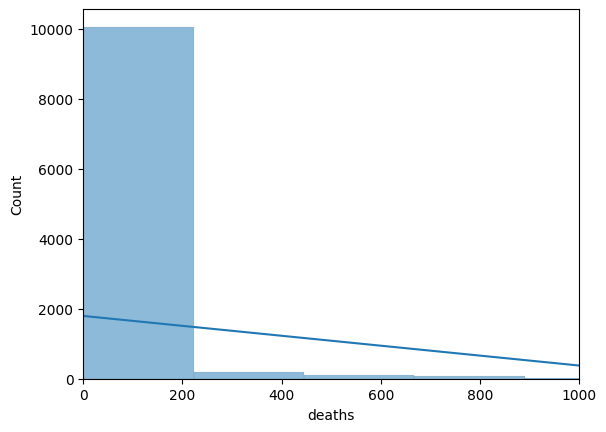

In [138]:
#### Checking Extreme Values for deaths

hist_deaths_1 = sns.histplot(df_geo['deaths'], bins=1000, kde = True) # shows extreme values for 'deaths'

#plt.xscale('log')
plt.xlim([0, 1000]) # xlim to zoom in to see the values

#plt.yscale('log')
#plt.ylim([0, 10000]) # ylim to zoom in to see the values

In [139]:
#Export viz
hist_deaths_1.figure.savefig(os.path.join(path, 'Analysis', 'Visualizations', 'hist_deaths_1.png'))

(0.0, 110.0)

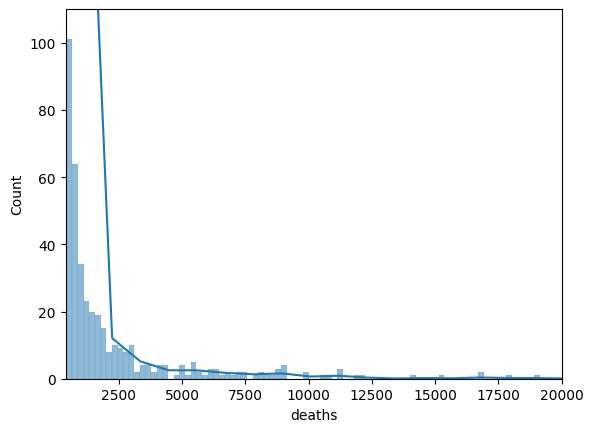

In [140]:
# Zooming in on the x and y axis now

hist_deaths_2 = sns.histplot(df_geo['deaths'], bins=1000, kde = True) # shows extreme values for 'deaths'

#plt.xscale('log')
plt.xlim([400, 20000]) # xlim to zoom in to see the values

#plt.yscale('log')
plt.ylim([0, 110]) # ylim to zoom in to see the values

In [141]:
#Export viz
hist_deaths_2.figure.savefig(os.path.join(path, 'Analysis', 'Visualizations', 'hist_deaths_2.png'))

In [51]:
# Check how many extreme values

df_geo[df_geo['deaths'] > 10000]

,country_code,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita
970,AFG,Afghanistan,2012,11333,Conflict and Terrorism,3.116138e+07,2.020357e+10,Low income,Asia,Southern Asia,0.036369,648.353043
1164,AFG,Afghanistan,2013,11817,Conflict and Terrorism,3.226959e+07,2.056449e+10,Low income,Asia,Southern Asia,0.036620,637.271377
1358,AFG,Afghanistan,2014,17950,Conflict and Terrorism,3.337079e+07,2.055058e+10,Low income,Asia,Southern Asia,0.053790,615.825406
1552,AFG,Afghanistan,2015,23662,Conflict and Terrorism,3.441360e+07,1.999814e+10,Low income,Asia,Southern Asia,0.068758,581.111592
1746,AFG,Afghanistan,2016,28051,Conflict and Terrorism,3.538313e+07,1.801955e+10,Low income,Asia,Southern Asia,0.079278,509.269684
6631,CHN,China,2008,88938,Natural Disaster,1.324655e+09,4.590000e+12,Lower Middle income,Asia,Eastern Asia,0.006714,3465.053165
7057,HTI,Haiti,2010,222641,Natural Disaster,9.949322e+06,1.185931e+10,Low income,Americas,Latin America and the Caribbean,2.237750,1191.971938
80,IRQ,Iraq,2007,25603,Conflict and Terrorism,2.791125e+07,8.883706e+10,Lower Middle income,Asia,Western Asia,0.091730,3182.840667
1244,IRQ,Iraq,2013,16890,Conflict and Terrorism,3.315705e+07,2.350000e+11,Upper Middle income,Asia,Western Asia,0.050939,7087.482149
1438,IRQ,Iraq,2014,33297,Conflict and Terrorism,3.441195e+07,2.280000e+11,Upper Middle income,Asia,Western Asia,0.096760,6625.605157


Text(0.5, 1.0, 'Logarithmic Histogram')

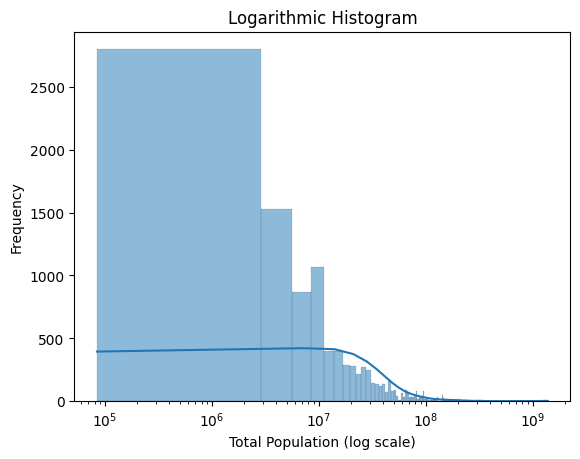

In [143]:
#### Checking Extreme Values for total_population

hist_total_population = sns.histplot(df_geo['total_population'], bins=500, kde = True) # shows extreme values for 'gdp_value'
plt.xscale('log')

plt.xlabel('Total Population (log scale)')
plt.ylabel('Frequency')
plt.title('Logarithmic Histogram')

In [144]:
#Export viz
hist_total_population.figure.savefig(os.path.join(path, 'Analysis', 'Visualizations', 'hist_total_population.png'))

In [53]:
df_geo[df_geo['total_population'] > 10 ** 8]

,country_code,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita
12,BGD,Bangladesh,2007,19,Conflict and Terrorism,1.426604e+08,7.961189e+10,Low income,Asia,Southern Asia,1.331834e-05,558.051860
2146,BGD,Bangladesh,2007,0,Epidemics,1.426604e+08,7.961189e+10,Low income,Asia,Southern Asia,6.659172e-06,558.051860
4280,BGD,Bangladesh,2007,0,Famine,1.426604e+08,7.961189e+10,Low income,Asia,Southern Asia,0.000000e+00,558.051860
6414,BGD,Bangladesh,2007,5505,Natural Disaster,1.426604e+08,7.961189e+10,Low income,Asia,Southern Asia,3.858815e-03,558.051860
8548,BGD,Bangladesh,2007,195,Other Injuries,1.426604e+08,7.961189e+10,Low income,Asia,Southern Asia,1.366883e-04,558.051860
206,BGD,Bangladesh,2008,22,Conflict and Terrorism,1.443042e+08,9.163128e+10,Low income,Asia,Southern Asia,1.524557e-05,634.987056
2340,BGD,Bangladesh,2008,0,Epidemics,1.443042e+08,9.163128e+10,Low income,Asia,Southern Asia,7.622787e-06,634.987056
4474,BGD,Bangladesh,2008,0,Famine,1.443042e+08,9.163128e+10,Low income,Asia,Southern Asia,0.000000e+00,634.987056
6608,BGD,Bangladesh,2008,68,Natural Disaster,1.443042e+08,9.163128e+10,Low income,Asia,Southern Asia,4.712269e-05,634.987056
8742,BGD,Bangladesh,2008,53,Other Injuries,1.443042e+08,9.163128e+10,Low income,Asia,Southern Asia,3.672798e-05,634.987056


Text(0.5, 1.0, 'Logarithmic Histogram')

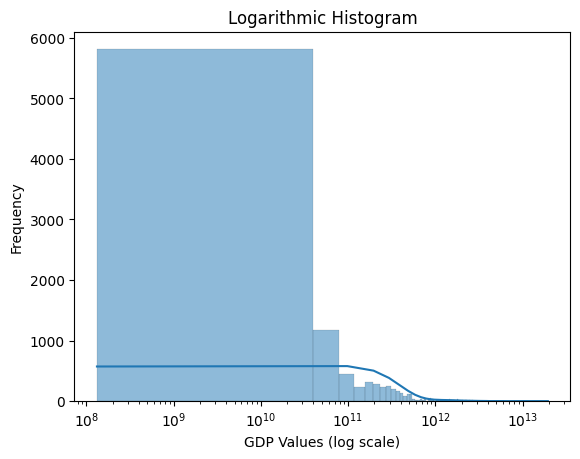

In [145]:
#### Checking Extreme Values for gdp_value

hist_gdp_value = sns.histplot(df_geo['gdp_value'], bins=500, kde = True) # shows extreme values for 'gdp_value'
plt.xscale('log')

plt.xlabel('GDP Values (log scale)')
plt.ylabel('Frequency')
plt.title('Logarithmic Histogram')

In [146]:
#Export Viz
hist_gdp_value.figure.savefig(os.path.join(path, 'Analysis', 'Visualizations', 'hist_gdp_value.png'))

In [55]:
df_geo[df_geo['gdp_value'] > 10 ** 10]

,country_code,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita
194,AFG,Afghanistan,2008,6749,Conflict and Terrorism,2.772228e+07,1.024977e+10,Low income,Asia,Southern Asia,2.434504e-02,369.730477
2328,AFG,Afghanistan,2008,22,Epidemics,2.772228e+07,1.024977e+10,Low income,Asia,Southern Asia,1.217252e-02,369.730477
4462,AFG,Afghanistan,2008,0,Famine,2.772228e+07,1.024977e+10,Low income,Asia,Southern Asia,0.000000e+00,369.730477
6596,AFG,Afghanistan,2008,0,Natural Disaster,2.772228e+07,1.024977e+10,Low income,Asia,Southern Asia,0.000000e+00,369.730477
8730,AFG,Afghanistan,2008,14,Other Injuries,2.772228e+07,1.024977e+10,Low income,Asia,Southern Asia,5.050090e-05,369.730477
388,AFG,Afghanistan,2009,7563,Conflict and Terrorism,2.839481e+07,1.215484e+10,Low income,Asia,Southern Asia,2.663515e-02,428.065355
2522,AFG,Afghanistan,2009,11,Epidemics,2.839481e+07,1.215484e+10,Low income,Asia,Southern Asia,1.331757e-02,428.065355
4656,AFG,Afghanistan,2009,0,Famine,2.839481e+07,1.215484e+10,Low income,Asia,Southern Asia,0.000000e+00,428.065355
6790,AFG,Afghanistan,2009,101,Natural Disaster,2.839481e+07,1.215484e+10,Low income,Asia,Southern Asia,3.556988e-04,428.065355
8924,AFG,Afghanistan,2009,39,Other Injuries,2.839481e+07,1.215484e+10,Low income,Asia,Southern Asia,1.373490e-04,428.065355


#### 3. Plotting a Choropleth map

In [ ]:
# Tried Updating a couple of country names in the json file first but when I searched it was not showing up
# The other choice is to update the country names in the primary dataset

In [56]:
try:
    # 1. Read the JSON file
    with open(world_geo, 'r') as json_file:
        data = json.load(json_file)

    # 2. Search for and update the data
    search_word_1 = 'Russia'
    if search_word_1 in data:
        data[search_word_1] = 'Russian Federation'
    else:
        print(f"The key '{search_word_1}' was not found in the JSON data.")
    
    search_word_2 = 'United States of America'
    if search_word_2 in data:
        data[search_word_2] = 'United States'    
    else:
        print(f"The key '{search_word_2}' was not found in the JSON data.")
    
    search_word_3 = 'Canada'
    if search_word_3 in data:
        print(f"The key '{search_word_3}' was found in the JSON data.")
    else:
        print(f"The key '{search_word_3}' was not found in the JSON data.")
    
    # 3. Serialize the updated data
    updated_json_data = json.dumps(data, indent=2)  # Indent for pretty formatting

    # 4. Write the updated data to the file
    with open('data.json', 'w') as json_file:
        json_file.write(updated_json_data)
    
except FileNotFoundError:
    print(f"The file '{file_path}' does not exist.")
except json.JSONDecodeError:
    print(f"Error decoding JSON in '{file_path}'. Check the file's JSON format.")
except Exception as e:
    print(f"An error occurred: {str(e)}")



The key 'Russia' was not found in the JSON data.
The key 'United States of America' was not found in the JSON data.
The key 'Canada' was not found in the JSON data.


In [57]:
# Finding average death_percentage in each country
df_avg_death_percentage = df_geo.groupby(['country'], as_index=False)['death_percentage'].mean()
df_avg_death_percentage

,country,death_percentage
0,Afghanistan,0.011654
1,Albania,0.000052
2,Algeria,0.000297
3,American Samoa,0.000041
4,Angola,0.000072
5,Antigua and Barbuda,0.000019
6,Argentina,0.000013
7,Armenia,0.000238
8,Australia,0.000033
9,Austria,0.000041


In [60]:
# Generate Choropleth map using geojson file, key is country(name)

# Setup a folium map at a high-level zoom
map_1 = folium.Map(location = [37, -97], zoom_start = 3.5)

# Load GeoJSON data
geojson_data = countries_geojson
geojson_layer = folium.GeoJson(geojson_data)

# Choropleth maps bind Pandas Data Frames and json geometries.This allows us to quickly visualize data combinations
folium.Choropleth(
    geo_data = geojson_layer,
    data = df_avg_death_percentage,
    columns = ['country', 'death_percentage'],
    key_on = 'feature.properties.ADMIN', # this part is very important - check your json file to see where the KEY is located
    fill_color = 'YlOrRd', fill_opacity=.75, line_opacity=0.1,
    nan_fill_color = 'white',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name = "Death percentage by Country").add_to(map_1)
folium.LayerControl().add_to(map_1)

map_1

#Save to html file -  Need to run by setting the path
#map_1.save('avg_death_percentages_by_country.html')


ValueError: Cannot render objects with any missing geometries: <folium.features.GeoJson object at 0x0000026CA84A2260>

In [64]:
# Checking the name of countries with geojson file for which data is missing

# Load GeoJSON data
geojson_data = countries_geojson  # Replace with your file path
geojson_layer = folium.GeoJson(geojson_data)

missing_data_countries = []

for feature in geojson_layer.data['features']:
    country_name = feature['properties']['ADMIN']  # Replace with the actual property used in your GeoJSON
    if country_name not in df_avg_death_percentage['country'].values:  # Replace 'country' with the key in your data
        missing_data_countries.append(country_name)

print("Countries with Missing Data:", missing_data_countries)

Countries with Missing Data: ['Aruba', 'Anguilla', 'Aland', 'Andorra', 'Antarctica', 'Ashmore and Cartier Islands', 'French Southern and Antarctic Lands', 'Bajo Nuevo Bank (Petrel Is.)', 'Saint Barthelemy', 'Ivory Coast', 'Clipperton Island', 'Cyprus No Mans Area', 'Republic of Congo', 'Cook Islands', 'Coral Sea Islands', 'CuraÃ§ao', 'Cayman Islands', 'Northern Cyprus', 'Dhekelia Sovereign Base Area', 'Falkland Islands', 'Faroe Islands', 'Guernsey', 'Gibraltar', 'Gambia', 'Guinea Bissau', 'Hong Kong S.A.R.', 'Heard Island and McDonald Islands', 'Isle of Man', 'Indian Ocean Territories', 'British Indian Ocean Territory', 'Jersey', 'Baykonur Cosmodrome', 'Siachen Glacier', 'Saint Kitts and Nevis', 'Kosovo', 'Liechtenstein', 'Macao S.A.R', 'Saint Martin', 'Monaco', 'Montserrat', 'New Caledonia', 'Norfolk Island', 'Niue', 'Nauru', 'Pitcairn Islands', 'Spratly Islands', 'Palau', 'French Polynesia', 'Russia', 'Western Sahara', 'Scarborough Reef', 'Serranilla Bank', 'South Georgia and South S

In [ ]:
b. Average GDP Per Capita by country

In [87]:
# Finding average death_percentage in each country
df_avg_gdp_per_capita = df_geo.groupby(['country'], as_index=False)['gdp_per_capita'].mean()
df_avg_gdp_per_capita

,country,gdp_per_capita
0,Afghanistan,528.036567
1,Albania,4223.492913
2,Algeria,4682.582303
3,American Samoa,4107.351875
4,Angola,3697.177073
5,Antigua and Barbuda,14197.544230
6,Argentina,11587.481261
7,Armenia,3591.687047
8,Australia,55314.451768
9,Austria,48484.114125


In [71]:
# Checking the name of countries with the json file for which data is missing
missing_data_countries = []

# Load JSON data from a file
with open(world_geo, 'r') as json_file:
    geo_data = json.load(json_file)
    
for feature in geo_data['features']:
    country_name = feature['properties']['name']  # Replace with the actual property used in your GeoJSON
    if country_name not in df_avg_death_percentage['country'].values:  # Replace 'country' with the key in your data
        missing_data_countries.append(country_name)

print("Countries with Missing Data:", missing_data_countries)

Countries with Missing Data: ['Antarctica', 'French Southern and Antarctic Lands', 'Ivory Coast', 'Republic of the Congo', 'Northern Cyprus', 'Falkland Islands', 'Gambia', 'Guinea Bissau', 'Kosovo', 'New Caledonia', 'Russia', 'Western Sahara', 'Somaliland', 'Republic of Serbia', 'East Timor', 'United Republic of Tanzania', 'United States of America', 'West Bank']


In [118]:
# Updating country names in the dataset to values as found in the JSON file.

df_geo['country'].replace('Tanzania', 'United Republic of Tanzania', inplace=True)

df_geo.loc[df_geo['country'] == 'United Republic of Tanzania']

,country_code,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita
169,TZA,United Republic of Tanzania,2007,8,Conflict and Terrorism,40681414.0,2.184353e+10,Low income,Africa,Sub-Saharan Africa,0.000020,536.941244
2303,TZA,United Republic of Tanzania,2007,165,Epidemics,40681414.0,2.184353e+10,Low income,Africa,Sub-Saharan Africa,0.000010,536.941244
4437,TZA,United Republic of Tanzania,2007,0,Famine,40681414.0,2.184353e+10,Low income,Africa,Sub-Saharan Africa,0.000000,536.941244
6571,TZA,United Republic of Tanzania,2007,0,Natural Disaster,40681414.0,2.184353e+10,Low income,Africa,Sub-Saharan Africa,0.000000,536.941244
8705,TZA,United Republic of Tanzania,2007,101,Other Injuries,40681414.0,2.184353e+10,Low income,Africa,Sub-Saharan Africa,0.000248,536.941244
363,TZA,United Republic of Tanzania,2008,7,Conflict and Terrorism,41853944.0,2.796153e+10,Low income,Africa,Sub-Saharan Africa,0.000017,668.073901
2497,TZA,United Republic of Tanzania,2008,88,Epidemics,41853944.0,2.796153e+10,Low income,Africa,Sub-Saharan Africa,0.000008,668.073901
4631,TZA,United Republic of Tanzania,2008,0,Famine,41853944.0,2.796153e+10,Low income,Africa,Sub-Saharan Africa,0.000000,668.073901
6765,TZA,United Republic of Tanzania,2008,73,Natural Disaster,41853944.0,2.796153e+10,Low income,Africa,Sub-Saharan Africa,0.000174,668.073901
8899,TZA,United Republic of Tanzania,2008,31,Other Injuries,41853944.0,2.796153e+10,Low income,Africa,Sub-Saharan Africa,0.000074,668.073901


In [120]:
# Check each of these countries in the dataset

# Filter based on a partial match 
filtered_df = df_geo[df_geo['country'].str.contains('United States', case=False, regex=True)]

filtered_df.shape

print(filtered_df)

      country_code                   country  year  deaths  \
184            USA  United States of America  2007    1021   
2318           USA  United States of America  2007      28   
4452           USA  United States of America  2007       0   
6586           USA  United States of America  2007     332   
8720           USA  United States of America  2007     140   
378            USA  United States of America  2008     472   
2512           USA  United States of America  2008      41   
4646           USA  United States of America  2008       0   
6780           USA  United States of America  2008     336   
8914           USA  United States of America  2008      65   
572            USA  United States of America  2009     484   
2706           USA  United States of America  2009      39   
4840           USA  United States of America  2009       0   
6974           USA  United States of America  2009     129   
9108           USA  United States of America  2009     112   
766     

In [79]:
# Check each of these countries in the dataset

# Filter based on a match (e.g., "United States")
filtered_df = df_geo.loc[df_geo['country'] == 'United States']
#filtered_df = df_geo[df_geo['country'].str.contains('United States', case=False, regex=True)]

filtered_df.shape

#print(filtered_df)


(55, 12)

In [78]:
filtered_df.head()

,country_code,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita
184,USA,United States,2007,1021,Conflict and Terrorism,301231207.0,1.450000e+13,High income,Americas,Northern America,0.000339,48135.782957
2318,USA,United States,2007,28,Epidemics,301231207.0,1.450000e+13,High income,Americas,Northern America,0.000169,48135.782957
4452,USA,United States,2007,0,Famine,301231207.0,1.450000e+13,High income,Americas,Northern America,0.000000,48135.782957
6586,USA,United States,2007,332,Natural Disaster,301231207.0,1.450000e+13,High income,Americas,Northern America,0.000110,48135.782957
8720,USA,United States,2007,140,Other Injuries,301231207.0,1.450000e+13,High income,Americas,Northern America,0.000046,48135.782957


In [82]:
# Update the country name 'United States' to 'United States of America'

df_geo['country'].replace('United States', 'United States of America', inplace=True)

df_geo.loc[df_geo['country'] == 'United States of America']

,country_code,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita
184,USA,United States of America,2007,1021,Conflict and Terrorism,301231207.0,1.450000e+13,High income,Americas,Northern America,0.000339,48135.782957
2318,USA,United States of America,2007,28,Epidemics,301231207.0,1.450000e+13,High income,Americas,Northern America,0.000169,48135.782957
4452,USA,United States of America,2007,0,Famine,301231207.0,1.450000e+13,High income,Americas,Northern America,0.000000,48135.782957
6586,USA,United States of America,2007,332,Natural Disaster,301231207.0,1.450000e+13,High income,Americas,Northern America,0.000110,48135.782957
8720,USA,United States of America,2007,140,Other Injuries,301231207.0,1.450000e+13,High income,Americas,Northern America,0.000046,48135.782957
378,USA,United States of America,2008,472,Conflict and Terrorism,304093966.0,1.480000e+13,High income,Americas,Northern America,0.000155,48669.166951
2512,USA,United States of America,2008,41,Epidemics,304093966.0,1.480000e+13,High income,Americas,Northern America,0.000078,48669.166951
4646,USA,United States of America,2008,0,Famine,304093966.0,1.480000e+13,High income,Americas,Northern America,0.000000,48669.166951
6780,USA,United States of America,2008,336,Natural Disaster,304093966.0,1.480000e+13,High income,Americas,Northern America,0.000110,48669.166951
8914,USA,United States of America,2008,65,Other Injuries,304093966.0,1.480000e+13,High income,Americas,Northern America,0.000021,48669.166951


In [83]:
# Check each of these countries in the dataset

# Filter based on a partial match (e.g., "Russia")
filtered_df = df_geo[df_geo['country'].str.contains('Russia', case=False, regex=True)]

filtered_df.shape

#print(filtered_df)

(55, 12)

In [84]:
print(filtered_df)

      country_code             country  year  deaths                   cause  \
140            RUS  Russian Federation  2007     301  Conflict and Terrorism   
2274           RUS  Russian Federation  2007       0               Epidemics   
4408           RUS  Russian Federation  2007       0                  Famine   
6542           RUS  Russian Federation  2007      54        Natural Disaster   
8676           RUS  Russian Federation  2007     292          Other Injuries   
334            RUS  Russian Federation  2008     582  Conflict and Terrorism   
2468           RUS  Russian Federation  2008       0               Epidemics   
4602           RUS  Russian Federation  2008       0                  Famine   
6736           RUS  Russian Federation  2008      69        Natural Disaster   
8870           RUS  Russian Federation  2008     108          Other Injuries   
528            RUS  Russian Federation  2009     888  Conflict and Terrorism   
2662           RUS  Russian Federation  

In [85]:
# Update the country name 'Russian Federation' to 'Russia'

df_geo['country'].replace('Russian Federation', 'Russia', inplace=True)

df_geo.loc[df_geo['country'] == 'Russia']

,country_code,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita
140,RUS,Russia,2007,301,Conflict and Terrorism,142805114.0,1.300000e+12,Upper Middle income,Europe,Eastern Europe,0.000211,9103.315446
2274,RUS,Russia,2007,0,Epidemics,142805114.0,1.300000e+12,Upper Middle income,Europe,Eastern Europe,0.000105,9103.315446
4408,RUS,Russia,2007,0,Famine,142805114.0,1.300000e+12,Upper Middle income,Europe,Eastern Europe,0.000000,9103.315446
6542,RUS,Russia,2007,54,Natural Disaster,142805114.0,1.300000e+12,Upper Middle income,Europe,Eastern Europe,0.000038,9103.315446
8676,RUS,Russia,2007,292,Other Injuries,142805114.0,1.300000e+12,Upper Middle income,Europe,Eastern Europe,0.000204,9103.315446
334,RUS,Russia,2008,582,Conflict and Terrorism,142742366.0,1.660000e+12,Upper Middle income,Europe,Eastern Europe,0.000408,11629.343456
2468,RUS,Russia,2008,0,Epidemics,142742366.0,1.660000e+12,Upper Middle income,Europe,Eastern Europe,0.000204,11629.343456
4602,RUS,Russia,2008,0,Famine,142742366.0,1.660000e+12,Upper Middle income,Europe,Eastern Europe,0.000000,11629.343456
6736,RUS,Russia,2008,69,Natural Disaster,142742366.0,1.660000e+12,Upper Middle income,Europe,Eastern Europe,0.000048,11629.343456
8870,RUS,Russia,2008,108,Other Injuries,142742366.0,1.660000e+12,Upper Middle income,Europe,Eastern Europe,0.000076,11629.343456


In [121]:
# Setup a folium map at a high-level zoom
map_2 = folium.Map(location = [0, 0], zoom_start = 2)

folium.Choropleth(
    geo_data = world_geo,
    data = df_avg_gdp_per_capita,
    columns = ['country', 'gdp_per_capita'],
    key_on = 'feature.properties.name', # this part is very important - check your json file to see where the KEY is located
    fill_color = 'YlOrRd', fill_opacity=.75, line_opacity=0.1,
    nan_fill_color = 'white',
    legend_name = "GDP Per Capita by Country").add_to(map_2)
folium.LayerControl().add_to(map_2)

map_2

In [148]:
# Saving the map
map_2.save(os.path.join(path, 'Analysis', 'Visualizations', "gdp_per_capita_map.html"))

In [ ]:
# a. Average death percentage in each country

In [91]:
# Finding average death_percentage in each country
df_avg_death_percentage = df_geo.groupby(['country'], as_index=False)['death_percentage'].mean()
df_avg_death_percentage

,country,death_percentage
0,Afghanistan,0.011654
1,Albania,0.000052
2,Algeria,0.000297
3,American Samoa,0.000041
4,Angola,0.000072
5,Antigua and Barbuda,0.000019
6,Argentina,0.000013
7,Armenia,0.000238
8,Australia,0.000033
9,Austria,0.000041


In [122]:
# Setup a folium map at a high-level zoom
#map_1 = folium.Map(location = [37, -97], zoom_start = 3.5)
map_1 = folium.Map(location = [0, 0], zoom_start = 2)

folium.Choropleth(
    geo_data = world_geo,
    data = df_avg_death_percentage,
    columns = ['country', 'death_percentage'],
    key_on = 'feature.properties.name', # this part is very important - check your json file to see where the KEY is located
    fill_color = 'YlOrRd', fill_opacity=.75, line_opacity=0.1,
    nan_fill_color = 'white',
    legend_name = "Death percentage by Country").add_to(map_1)
folium.LayerControl().add_to(map_1)

map_1

In [149]:
# Saving the map
map_1.save(os.path.join(path, 'Analysis', 'Visualizations', "death_percentage_map.html"))

In [ ]:
# c. Average Total population by country

In [89]:
# Finding average death_percentage in each country
df_avg_total_population = df_geo.groupby(['country'], as_index=False)['total_population'].mean()
df_avg_total_population

,country,total_population
0,Afghanistan,3.140140e+07
1,Albania,2.907084e+06
2,Algeria,3.754424e+07
3,American Samoa,4.138920e+07
4,Angola,2.520921e+07
5,Antigua and Barbuda,9.013236e+04
6,Argentina,4.178819e+07
7,Armenia,2.907537e+06
8,Australia,2.273512e+07
9,Austria,8.486223e+06


In [123]:
# Setup a folium map at a high-level zoom
map_3 = folium.Map(location = [0, 0], zoom_start = 2)

folium.Choropleth(
    geo_data = world_geo,
    data = df_avg_total_population,
    columns = ['country', 'total_population'],
    key_on = 'feature.properties.name', # this part is very important - check your json file to see where the KEY is located
    fill_color = 'YlOrRd', fill_opacity=.75, line_opacity=0.1,
    nan_fill_color = 'white',
    legend_name = "Total population by Country").add_to(map_3)
folium.LayerControl().add_to(map_3)

map_3

In [150]:
# Saving the map
map_3.save(os.path.join(path, 'Analysis', 'Visualizations', "total_population_map.html"))

In [151]:
# Export the df_geo dataset 
# Filled in missing values for the numeric columns by first interpolating and then extrapolating.
# Updated few country names to match the JSON file to create maps.

df_geo.to_csv(os.path.join(path, 'Data','Prepared Data', 'causes_of_deaths_cleaned_for_geo.csv'))

#### The task to generate simple Choropleth maps is over.
#### The below maps are the ones I would like to generate with pop up markers using other variables for fun.
#### I'm getting max tries error as I use the geocode libarary, Nominatim. I could use google maps API but seems pricey.
#### So, please guide me here.

##### Need help for the below maps

In [ ]:
#  d. Average total population and income group by country (Income group is a categorical variable)

In [ ]:
#  e. Average total population and cause of deaths by country (cause of deaths is a categorical variable)

In [ ]:
#  f. Average total population and average death percentage by country 

In [ ]:
#  g. Average gdp per capita and average death percentage by country 

In [ ]:
#  h. Average gdp per capita and cause of deaths by country (cause of deaths is a categorical variable)

In [ ]:
#  i. Average death_percentage and income group by country (Income group is a categorical variable)

In [152]:
# Finding average death_percentage in each country by income_group
df_avg_death_percentage_income_group = df_geo.groupby(['country','income_group'], as_index=False)['death_percentage'].mean()
df_avg_death_percentage_income_group.head()

,country,income_group,death_percentage
0,Afghanistan,Low income,0.011654
1,Albania,Lower Middle income,0.000086
2,Albania,Upper Middle income,0.000039
3,Algeria,Lower Middle income,0.000666
4,Algeria,Upper Middle income,0.000261


In [ ]:
#  j. Average death_percentage and cause of deaths by country - Below - Having issues
# Attempted (cause of deaths is a categorical variable, codified to numeric)

In [ ]:
Creating Folium map with death_percentage and cause below.
Facing challenges 
1. Getting error from the Geocode library that maximum connections have been reached and is timing out.
2. Can use Google maps API , but looks like it is pricey!!
3. Tried to merge a dataset with latitude and longitude instead from Kaggle, but the values are missing for many countries, 
   meaning many country names are not matching with the primary dataset.
4. Need to rectify this, may be update the missing latitude and longitude values for the countries manually? It is very tedious.


In [124]:
# Finding average death_percentage in each country by cause
df_avg_death_percentage_cause = df_geo.groupby(['country','cause'], as_index=False)['death_percentage'].mean()
df_avg_death_percentage_cause.head()

,country,cause,death_percentage
0,Afghanistan,Conflict and Terrorism,0.038053
1,Afghanistan,Epidemics,0.019027
2,Afghanistan,Famine,0.000000
3,Afghanistan,Natural Disaster,0.000666
4,Afghanistan,Other Injuries,0.000525


In [125]:
# Import World countries csv with longitude and latitude since the geo library was giving max tries error

df_countries_lat_long = pd.read_csv(os.path.join(path, 'Data', 'Original Data', 'world_country_and_usa_states_latitude_and_longitude_values.csv'), index_col = False)

In [124]:
df_countries_lat_long

,country_code,latitude,longitude,country,usa_state_code,usa_state_latitude,usa_state_longitude,usa_state
0,AD,42.546245,1.601554,Andorra,AK,63.588753,-154.493062,Alaska
1,AE,23.424076,53.847818,United Arab Emirates,AL,32.318231,-86.902298,Alabama
2,AF,33.939110,67.709953,Afghanistan,AR,35.201050,-91.831833,Arkansas
3,AG,17.060816,-61.796428,Antigua and Barbuda,AZ,34.048928,-111.093731,Arizona
4,AI,18.220554,-63.068615,Anguilla,CA,36.778261,-119.417932,California
5,AL,41.153332,20.168331,Albania,CO,39.550051,-105.782067,Colorado
6,AM,40.069099,45.038189,Armenia,CT,41.603221,-73.087749,Connecticut
7,AN,12.226079,-69.060087,Netherlands Antilles,DC,38.905985,-77.033418,District of Columbia
8,AO,-11.202692,17.873887,Angola,DE,38.910832,-75.527670,Delaware
9,AQ,-75.250973,-0.071389,Antarctica,FL,27.664827,-81.515754,Florida


In [126]:
# Merge df_countries_lat_long with df_geo
df_merged_1 = pd.merge(df_geo, df_countries_lat_long,  how='left', on=['country'], indicator = True)

In [127]:
df_merged_1.head()

,country_code_x,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita,country_code_y,latitude,longitude,usa_state_code,usa_state_latitude,usa_state_longitude,usa_state,_merge
0,AFG,Afghanistan,2007,8216,Conflict and Terrorism,27100536.0,9.715765e+09,Low income,Asia,Southern Asia,0.030317,358.508227,AF,33.93911,67.709953,AR,35.20105,-91.831833,Arkansas,both
1,AFG,Afghanistan,2007,0,Epidemics,27100536.0,9.715765e+09,Low income,Asia,Southern Asia,0.015158,358.508227,AF,33.93911,67.709953,AR,35.20105,-91.831833,Arkansas,both
2,AFG,Afghanistan,2007,0,Famine,27100536.0,9.715765e+09,Low income,Asia,Southern Asia,0.000000,358.508227,AF,33.93911,67.709953,AR,35.20105,-91.831833,Arkansas,both
3,AFG,Afghanistan,2007,296,Natural Disaster,27100536.0,9.715765e+09,Low income,Asia,Southern Asia,0.001092,358.508227,AF,33.93911,67.709953,AR,35.20105,-91.831833,Arkansas,both
4,AFG,Afghanistan,2007,41,Other Injuries,27100536.0,9.715765e+09,Low income,Asia,Southern Asia,0.000151,358.508227,AF,33.93911,67.709953,AR,35.20105,-91.831833,Arkansas,both


In [128]:
#check for full match
df_merged_1['_merge'].value_counts()

both          9790
left_only      880
right_only       0
Name: _merge, dtype: int64

In [128]:
df_merged_1.shape

(10670, 20)

In [129]:
df_merged_1.isnull().sum()

country_code_x            0
country                   0
year                      0
deaths                    0
cause                     0
total_population          0
gdp_value                 0
income_group              0
region                    0
sub_region                0
death_percentage          0
gdp_per_capita            0
country_code_y          935
latitude                880
longitude               880
usa_state_code         8525
usa_state_latitude     8525
usa_state_longitude    8525
usa_state              8525
_merge                    0
dtype: int64

In [130]:
# Drop the state columns, it is totally irrelevant
df_merged_1 = df_merged_1.drop(columns = ['usa_state_code','usa_state_latitude','usa_state_longitude','usa_state'])
df_merged_1 = df_merged_1.drop(columns = ['country_code_y'])

In [131]:
df_merged_1.isnull().sum()

country_code_x        0
country               0
year                  0
deaths                0
cause                 0
total_population      0
gdp_value             0
income_group          0
region                0
sub_region            0
death_percentage      0
gdp_per_capita        0
latitude            880
longitude           880
_merge                0
dtype: int64

In [132]:
df_Nan_latitude = df_merged_1[df_merged_1['latitude'].isnull() == True]

In [133]:
df_Nan_latitude

,country_code_x,country,year,deaths,cause,total_population,gdp_value,income_group,region,sub_region,death_percentage,gdp_per_capita,latitude,longitude,_merge
2090,COG,Congo,2007,2,Conflict and Terrorism,3876119.0,8.782703e+09,Lower Middle income,Africa,Sub-Saharan Africa,0.000052,2265.849792,NaN,NaN,left_only
2091,COG,Congo,2007,133,Epidemics,3876119.0,8.782703e+09,Lower Middle income,Africa,Sub-Saharan Africa,0.000026,2265.849792,NaN,NaN,left_only
2092,COG,Congo,2007,0,Famine,3876119.0,8.782703e+09,Lower Middle income,Africa,Sub-Saharan Africa,0.000000,2265.849792,NaN,NaN,left_only
2093,COG,Congo,2007,0,Natural Disaster,3876119.0,8.782703e+09,Lower Middle income,Africa,Sub-Saharan Africa,0.000000,2265.849792,NaN,NaN,left_only
2094,COG,Congo,2007,40,Other Injuries,3876119.0,8.782703e+09,Lower Middle income,Africa,Sub-Saharan Africa,0.001032,2265.849792,NaN,NaN,left_only
2095,COG,Congo,2008,1,Conflict and Terrorism,4011486.0,1.164986e+10,Lower Middle income,Africa,Sub-Saharan Africa,0.000025,2904.125220,NaN,NaN,left_only
2096,COG,Congo,2008,4,Epidemics,4011486.0,1.164986e+10,Lower Middle income,Africa,Sub-Saharan Africa,0.000012,2904.125220,NaN,NaN,left_only
2097,COG,Congo,2008,0,Famine,4011486.0,1.164986e+10,Lower Middle income,Africa,Sub-Saharan Africa,0.000000,2904.125220,NaN,NaN,left_only
2098,COG,Congo,2008,0,Natural Disaster,4011486.0,1.164986e+10,Lower Middle income,Africa,Sub-Saharan Africa,0.000000,2904.125220,NaN,NaN,left_only
2099,COG,Congo,2008,54,Other Injuries,4011486.0,1.164986e+10,Lower Middle income,Africa,Sub-Saharan Africa,0.001346,2904.125220,NaN,NaN,left_only


In [ ]:
# Create cause_id to add marker on the folium map along with death_percentage

In [135]:
# Create a mapping between unique 'cause' categories and unique numeric identifiers
cause_mapping = {cause: idx for idx, cause in enumerate(df_avg_death_percentage_cause['cause'].unique())}

# Add a new numeric 'cause_id' column to your DataFrame using the mapping
df_avg_death_percentage_cause['cause_id'] = df_avg_death_percentage_cause['cause'].map(cause_mapping)



In [136]:
df_avg_death_percentage_cause

,country,cause,death_percentage,cause_id
0,Afghanistan,Conflict and Terrorism,3.805334e-02,0
1,Afghanistan,Epidemics,1.902667e-02,1
2,Afghanistan,Famine,0.000000e+00,2
3,Afghanistan,Natural Disaster,6.664036e-04,3
4,Afghanistan,Other Injuries,5.247399e-04,4
5,Albania,Conflict and Terrorism,3.146619e-06,0
6,Albania,Epidemics,1.573309e-06,1
7,Albania,Famine,0.000000e+00,2
8,Albania,Natural Disaster,1.888281e-05,3
9,Albania,Other Injuries,2.363020e-04,4


In [137]:
# Create a Folium map with death_percentage and add popup marker with cause of death
map = folium.Map(location=[37, -97], zoom_start=3.5)

# Add a Choropleth layer to visualize data
folium.Choropleth(
    geo_data=world_geo,
    data=df_avg_death_percentage_cause,
    columns=['country', 'cause_id', 'death_percentage'],  # Include both columns
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.75,
    line_opacity=0.1,
    nan_fill_color='white',
    legend_name="Death percentage by Country"
).add_to(map)

# Initialize a geocoder

geolocator = Nominatim(user_agent="choropleth_map_other")

#country_name = 'Paris'
#location = geolocator.geocode(country_name)
#print(location.latitude)
#print(location.longitude)

#geolocator = Nominatim(user_agent="choropleth_map")
#geolocator = Nominatim(user_agent="choropleth_map", timeout=10)  # Increase timeout to 10 seconds

# Add a custom popup for each country to display both pieces of information
for idx, row in df_avg_death_percentage_cause.iterrows():
    
    #print(row['country'])
    
    country_name = ''
    country_name = row['country']
    
    location = geolocator.geocode(country_name)
    
    if location:
        latitude = location.latitude
        longitude = location.longitude

        country_info = f"Country: {row['country']}<br>"
        cause_info = f"Cause of Death: {row['cause']}"
        death_info = f"Death Percentage: {row['death_percentage']}<br>"
    

        # Combine all information for the popup
        popup_info = country_info + cause_info + death_info 

        # Create a popup with the combined information
        popup = folium.Popup(popup_info, max_width=300)

        # Add the popup to the Choropleth layer for the corresponding country
        folium.CircleMarker(
            location = [latitude, longitude],  # Replace with your lat/lon columns
            radius=5,
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.7,
            popup=popup  # Set the popup
        ).add_to(map)

# Add a layer control to toggle the Choropleth layer
folium.LayerControl().add_to(map)

# Display the map
map


#map.save("your_map.html")


GeocoderUnavailable: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search?q=Albania&format=json&limit=1 (Caused by ReadTimeoutError("HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Read timed out. (read timeout=1)"))